In [1]:
import pandas as pd
import numpy as np
import tangram as tg
import scanpy as sc
import squidpy as sq
import torch
import os
import anndata as ad
from scipy.io import mmread
import scipy
import sys
import pandas as pd
import numpy as np
import tangram as tg
import scanpy as sc
import squidpy as sq
import torch
import cell2location
from cell2location.utils.filtering import filter_genes
from cell2location.models import RegressionModel
import scvi
import os
from scipy.io import mmread
import scipy
import sys
import pickle
# select one slide
from cell2location.utils import select_slide
#Really quick loader from workstation
def scrna_loader(data_dir):
    data_dir = data_dir.replace("/data/work/Projects/","/mnt/IthacaSTU/")
    data_dir = data_dir + "/Output"
    
    counts = mmread(data_dir + "/all_samples_counts.mtx")
    with open(data_dir + "/all_samples_genenames.txt","r+") as f:
        genes = f.read().splitlines()
    genes = genes[1:] #Delete the trailing x
    genes = [x.split('"')[3] for x in genes] #Grab actual gene names
    genes = np.array(genes)
    #We won't need these, but we can load them so we can create an appopriate DF after.
    with open(data_dir + "/all_samples_cellnames.txt","r+") as f:
        samplenames = f.read().splitlines()
    samplenames = samplenames[1:]
    samplenames = [x.split('"')[3] for x in samplenames]
    samplenames = np.array(samplenames)
    counts = scipy.sparse.csr_matrix(counts) #Convert from COO to CSR. Also fast.
    metadata = pd.read_csv(data_dir + "/all_samples_metadata.csv")
    counts = pd.DataFrame(counts.T.todense(),index=samplenames.flatten(),columns=genes.flatten())
    metadata.index = metadata["cell"]
    adata = sc.AnnData(counts)
    adata.obs = metadata
    return(adata)

def visium_loader(data_dir):
    data_dir = data_dir.replace("/data/work/Projects/","/mnt/IthacaSTU/")
    data_dir = data_dir + "/Output"
    
    counts = mmread(data_dir + "/counts.mtx")
    with open(data_dir + "/counts_rownames.txt","r+") as f:
        genes = f.read().splitlines()
    genes = genes[1:] #Delete the trailing x
    genes = [x.split('"')[3] for x in genes] #Grab actual gene names
    genes = np.array(genes)
    #We won't need these, but we can load them so we can create an appopriate DF after.
    with open(data_dir + "/counts_colnames.txt","r+") as f:
        samplenames = f.read().splitlines()
    samplenames = samplenames[1:]
    samplenames = [x.split('"')[3] for x in samplenames]
    samplenames = np.array(samplenames)
    counts = scipy.sparse.csr_matrix(counts) #Convert from COO to CSR. Also fast.
    metadata = pd.read_table(data_dir + "/metadata.csv",delimiter=",")
    counts = pd.DataFrame(counts.T.todense(),index=samplenames.flatten(),columns=genes.flatten())
    metadata.index = metadata["Cell"]
    adata = sc.AnnData(counts)
    adata.obs = metadata
    return(adata)
    adata.obsm['spatial'] = adata.obs[['imagerow','imagecol']].values
    return(adata)
if len(sys.argv) == 1 or "ipykernel" in sys.argv[0]:
    data_dir_scrna = "/data/work/Projects/STU/230726_DiCarvalho_Cytassist/Carvalho_lab_GEX_annotated/"
    data_dir_visium = "/data/work/Projects/STU/230726_DiCarvalho_Cytassist/All"
    celltype_col = "cell_type"
else:
    data_dir_scrna = sys.argv[1]
    data_dir_visium = sys.argv[2]
    celltype_col = sys.argv[3]

In [ ]:
torch.cuda.is_available()

In [3]:
#Load
sc_obj = sc.read_h5ad(data_dir_scrna.replace("/data/work/Projects","/mnt/IthacaSTU") + "/RAW_final_obj_without1132_annotated_for_VISIUM.h5ad")
st_obj = visium_loader(data_dir_visium)
samples = st_obj.obs['Sample'].unique()
var_names = sc_obj.raw.var_names
obs_names = sc_obj.raw.obs_names
sc_obj = ad.AnnData(sc_obj.raw.X.astype(int),obs=sc_obj.obs)
sc_obj.var_names = var_names
sc_obj.obs_names = obs_names
celltype_col='cell_type'


In [4]:
import squidpy as sq

In [ ]:
#Load the actual Visium samples
samples_visnames = ['NR1','NR6','NR3-1','NR3-2']
sr_dir="/mnt/IthacaSTU/STU/230726_DiCarvalho_Cytassist/"
accs_visnames = [x for x in os.listdir(sr_dir) if x.endswith("SR210")]
st_objs = [sq.read.visium("/mnt/IthacaSTU/STU/230726_DiCarvalho_Cytassist/" + x + "/outs") for x in os.listdir(sr_dir) if x.endswith("SR210")]
[sc.pp.filter_cells(x,min_counts=600) for x in st_objs]
[sc.pp.filter_cells(x,min_genes=400) for x in st_objs]

[x.var_names_make_unique() for x in st_objs]
for i in range(len(st_objs)):
    st_objs[i].obs_names = [samples_visnames[i] + "_" + x for x in st_objs[i].obs_names]
    st_objs[i].obs['Sample'] = samples_visnames[i]
st_objs_new = []
for i in range(len(st_objs)):
    print("Initial number:", str(st_objs[i].n_obs))
    my_bool = np.isnan(st_objs[i].obsm['spatial']).sum(axis=1) == 2
    print("Number of NAs:", str(my_bool.sum()))
    st_objs2 = st_objs[i][~my_bool,:].copy()
    print("New number:", str(st_objs2.n_obs))
    st_objs_new.append(st_objs2)
st_objs = st_objs_new
adata_vis_all = ad.concat(st_objs, merge="same", uns_merge="unique")

for i in range(len(accs_visnames)):
    k_old = accs_visnames[i]
    k_new = samples_visnames[i]
    adata_vis_all.uns['spatial'][k_new] = adata_vis_all.uns['spatial'].pop(k_old)


In [6]:
adata_vis_all.n_obs

11169

In [7]:
np.median(np.sum(adata_vis_all.X.toarray() > 0,axis=0))

2718.5

In [9]:
import jaxlib

In [11]:
import jax

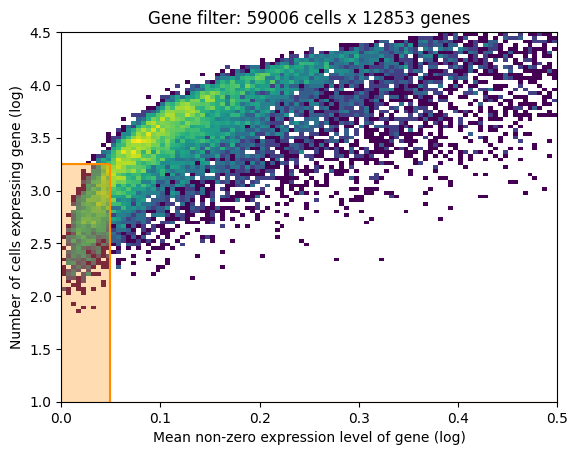

Anndata setup with scvi-tools version 1.1.6.post2.

Setup via `RegressionModel.setup_anndata` with arguments:

{
│   'layer': None,
│   'batch_key': 'Sample',
│   'labels_key': 'cell_type',
│   'categorical_covariate_keys': None,
│   'continuous_covariate_keys': None
}

         Summary Statistics         
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃     Summary Stat Key     ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│         n_batch          │  14   │
│         n_cells          │ 59006 │
│ n_extra_categorical_covs │   0   │
│ n_extra_continuous_covs  │   0   │
│         n_labels         │   9   │
│          n_vars          │ 12853 │
└──────────────────────────┴───────┘

               Data Registry                
┏━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Registry Key ┃    scvi-tools Location    ┃
┡━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      X       │          adata.X          │
│    batch     │ adata.obs['_scvi_batch']  │
│    ind_x     │   adata.obs['_indices']   │
│    labels    │ adata.obs['_scvi_labels'] │
└──────────────┴───────────────────────────┘

                   batch State Registry                   
┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃   Source Location   ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['Sample'] │    NR1     │          0          │
│                     │    NR2     │          1          │
│                     │    NR3     │          2          │
│                     │    NR4     │          3          │
│                     │    NR5     │          4          │
│                     │    NR6     │          5          │
│                     │    NR7     │          6          │
│                     │    NR8     │          7          │
│                     │     R1     │          8          │
│                     │     R2     │          9          │
│                     │     R3     │         10          │
│                     │     R4     │         11          │
│                     │     R5     │         12          │
│                     │     R6     │         13          │
└─────────────────────┴────────────┴─────────────────────┘

                        labels State Registry                         
┏━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃    Source Location     ┃     Categories      ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['cell_type'] │   epithelial(uro)   │          0          │
│                        │      immune-B       │          1          │
│                        │    immune-Macro     │          2          │
│                        │     immune-Mast     │          3          │
│                        │    immune-Plasma    │          4          │
│                        │      immune-T       │          5          │
│                        │     stromal-CAF     │          6          │
│                        │ stromal-Endothelial │          7          │
│                        │     stromal-SMC     │          8          │
└────────────────────────┴─────────────────────┴─────────────────────┘

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA GeForce RTX 3090') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 500/500: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [27:35<00:00,  3.33s/it, v_num=1, elbo_train=2.87e+8]

`Trainer.fit` stopped: `max_epochs=500` reached.


Epoch 500/500: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [27:35<00:00,  3.31s/it, v_num=1, elbo_train=2.87e+8]


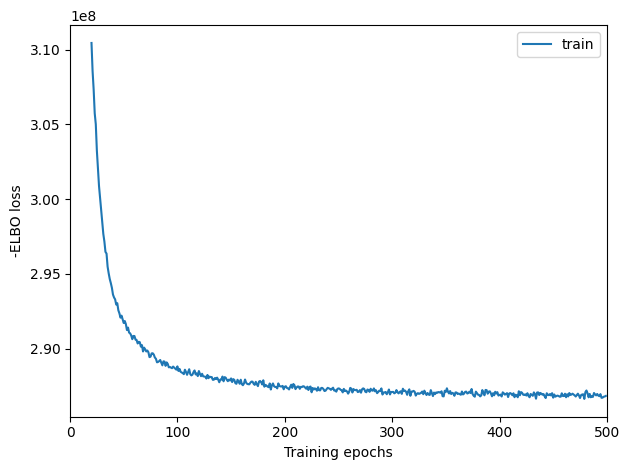

In [13]:
## samples = st_obj.obs['Sample'].unique()
ref_run_name="C2L" + "_All_January2025"
sc_obj_atlas = sc_obj.copy()
selected = filter_genes(sc_obj_atlas, cell_count_cutoff=5, cell_percentage_cutoff2=0.03, nonz_mean_cutoff=1.12)
# filter the object
sc_obj_atlas = sc_obj_atlas[:, selected].copy()
#Create the SCVI view of the object
cell2location.models.RegressionModel.setup_anndata(adata=sc_obj_atlas,
                        # 10X reaction / sample / batch
                        batch_key='Sample',
                        # cell type, covariate used for constructing signatures
                        labels_key='cell_type',
                        # multiplicative technical effects (platform, 3' vs 5', donor effect)
                       )
# create the regression model
from cell2location.models import RegressionModel
mod = RegressionModel(sc_obj_atlas)

# view anndata_setup as a sanity check
mod.view_anndata_setup()

mod.train(max_epochs=500)
mod.plot_history(20)

In [ ]:
adata_ref = mod.export_posterior(
    sc_obj_atlas, sample_kwargs={'num_samples': 1000, 'batch_size': 2500}
)

In [16]:
import torch as t
t.set_float32_matmul_precision("medium")

In [17]:
ref_run_name = data_dir_scrna.replace("/data/work/Projects","/mnt/IthacaSTU")


In [18]:
adata_file = f"{ref_run_name}/sc.h5ad"


In [ ]:
# Save model
mod.save(ref_run_name, overwrite=True)

# Save anndata object with results
adata_ref.write(adata_file)
adata_file

In [ ]:
adata_file = f"{ref_run_name}/sc.h5ad"
adata_ref = sc.read_h5ad(adata_file)
mod = cell2location.models.RegressionModel.load(f"{ref_run_name}", adata_ref)

In [21]:
# export estimated expression in each cluster
if 'means_per_cluster_mu_fg' in adata_ref.varm.keys():
    inf_aver = adata_ref.varm['means_per_cluster_mu_fg'][[f'means_per_cluster_mu_fg_{i}'
                                    for i in adata_ref.uns['mod']['factor_names']]].copy()
else:
    inf_aver = adata_ref.var[[f'means_per_cluster_mu_fg_{i}'
                                    for i in adata_ref.uns['mod']['factor_names']]].copy()
inf_aver.columns = adata_ref.uns['mod']['factor_names']

In [22]:
import matplotlib.pyplot as plt 

In [23]:
filedir=data_dir_visium.replace("/data/work/Projects/","/mnt/IthacaSTU/") + "/Output/"
run_name=filedir

In [24]:
adata_vis_all.uns['spatial'].keys()

dict_keys(['NR1', 'NR6', 'NR3-1', 'NR3-2'])

In [ ]:
adata_vis = adata_vis_all.copy()
adata_vis.var_names_make_unique()
intersect = np.intersect1d(adata_vis.var_names, inf_aver.index)
adata_vis = adata_vis[:, intersect].copy()
inf_aver = inf_aver.loc[intersect, :].copy()

# prepare anndata for cell2location model
cell2location.models.Cell2location.setup_anndata(adata=adata_vis, batch_key="Sample")
# create and train the model
# create and train the model
mod = cell2location.models.Cell2location(
    adata_vis, cell_state_df=inf_aver,
    # the expected average cell abundance: tissue-dependent
    # hyper-prior which can be estimated from paired histology:
    N_cells_per_location=20,
    # hyperparameter controlling normalisation of
    # within-experiment variation in RNA detection:
    detection_alpha=1000
)
mod.view_anndata_setup()
mod.train(max_epochs=30000,
  # train using full data (batch_size=None)
  batch_size=None,
  # use all data points in training because
  # we need to estimate cell abundance at all locations
  train_size=1,
 )

In [ ]:
#Load the actual Visium samples
samples_visnames = ['NR1','NR6','NR3-1','NR3-2']
sr_dir="/mnt/IthacaSTU/STU/230726_DiCarvalho_Cytassist/"
accs_visnames = [x for x in os.listdir(sr_dir) if x.endswith("SR210")]
st_objs = [sq.read.visium("/mnt/IthacaSTU/STU/230726_DiCarvalho_Cytassist/" + x + "/outs") for x in os.listdir(sr_dir) if x.endswith("SR210")]
[x.var_names_make_unique() for x in st_objs]
for i in range(len(st_objs)):
    st_objs[i].obs_names = [samples_visnames[i] + "_" + x for x in st_objs[i].obs_names]
    st_objs[i].obs['Sample'] = samples_visnames[i]
adata_vis_all = ad.concat(
    st_objs,
    uns_merge="unique",
    index_unique=None
)
#adata_vis_all = adata_vis_all[:,adata_vis_all.var_names.isin(st_obj.var_names)]
sc.pp.filter_cells(adata_vis_all,min_counts=600)
sc.pp.filter_cells(adata_vis_all,min_genes=400)
for i in range(len(accs_visnames)):
    k_old = accs_visnames[i]
    k_new = samples_visnames[i]
    adata_vis_all.uns['spatial'][k_new] = adata_vis_all.uns['spatial'].pop(k_old)


In [ ]:

#Same idea but do them separately
mods = []
adata_vis_c2l = list()
for i in range(len(samples_visnames)):
    adata_vis = select_slide(adata_vis_all.copy(),samples_visnames[i],"Sample").copy()
    adata_vis.var_names_make_unique()
    intersect = np.intersect1d(adata_vis.var_names, inf_aver.index)
    adata_vis = adata_vis[:, intersect].copy()
    inf_aver = inf_aver.loc[intersect, :].copy()
    
    # prepare anndata for cell2location model
    cell2location.models.Cell2location.setup_anndata(adata=adata_vis)
    # create and train the model
    # create and train the model
    mod = cell2location.models.Cell2location(
        adata_vis, cell_state_df=inf_aver,
        # the expected average cell abundance: tissue-dependent
        # hyper-prior which can be estimated from paired histology:
        N_cells_per_location=20,
        # hyperparameter controlling normalisation of
        # within-experiment variation in RNA detection:
        detection_alpha=100
    )
    mod.view_anndata_setup()
    mod.train(max_epochs=30000,
      # train using full data (batch_size=None)
      batch_size=None,
      # use all data points in training because
      # we need to estimate cell abundance at all locations
      train_size=1,
      use_gpu=True,
     )
    mod.plot_history(1000)
    print("Here")
    plt.legend(labels=['full data training'])
    adata_vis = mod.export_posterior(
        adata_vis, sample_kwargs={'num_samples': 1000, 'batch_size': mod.adata.n_obs, 'use_gpu': True}
    )
    
    # Save model
    mod.samples = adata_vis.uns['mod']
    mod.plot_QC()
    adata_vis_c2l.append(adata_vis)
    mods.append(mod)

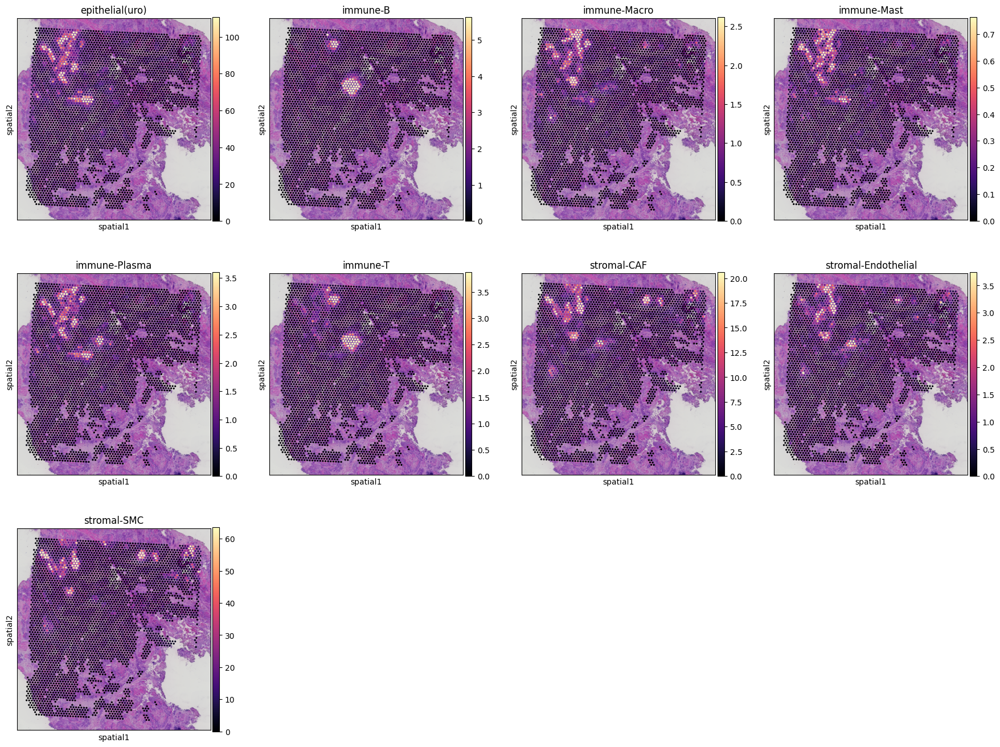

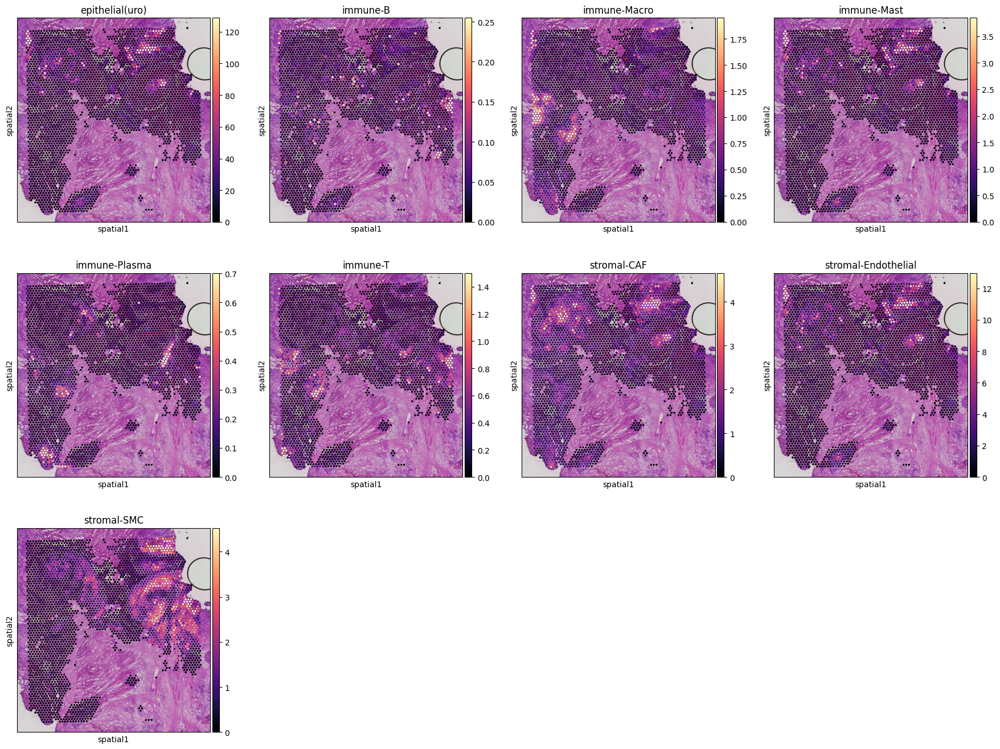

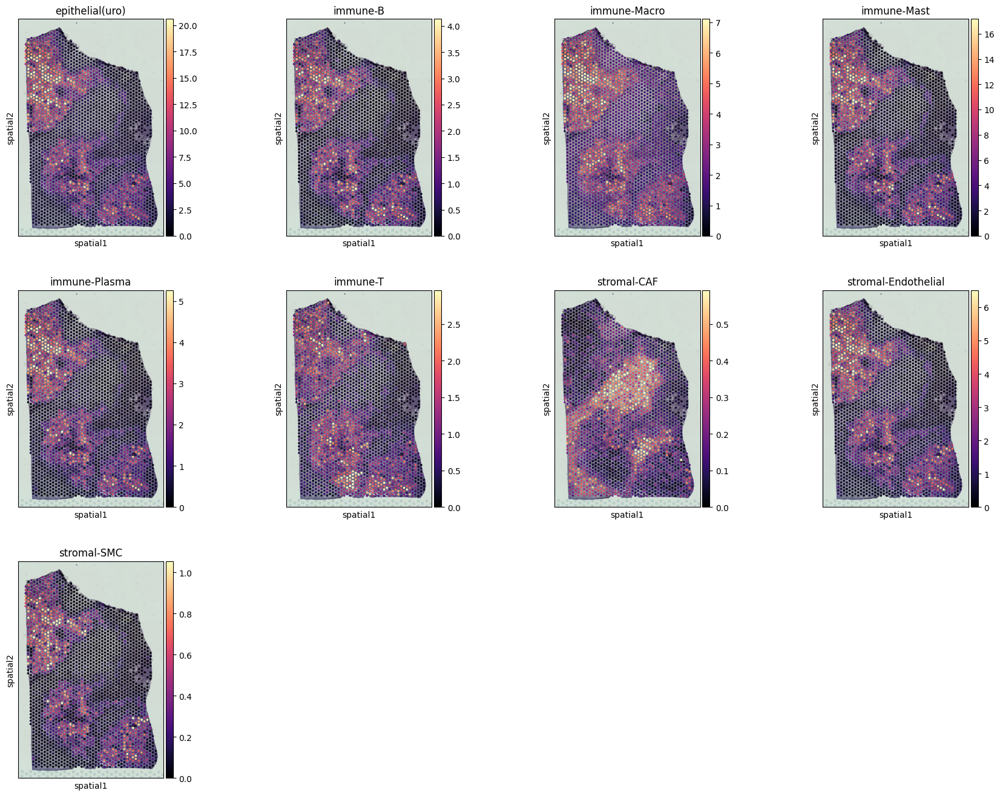

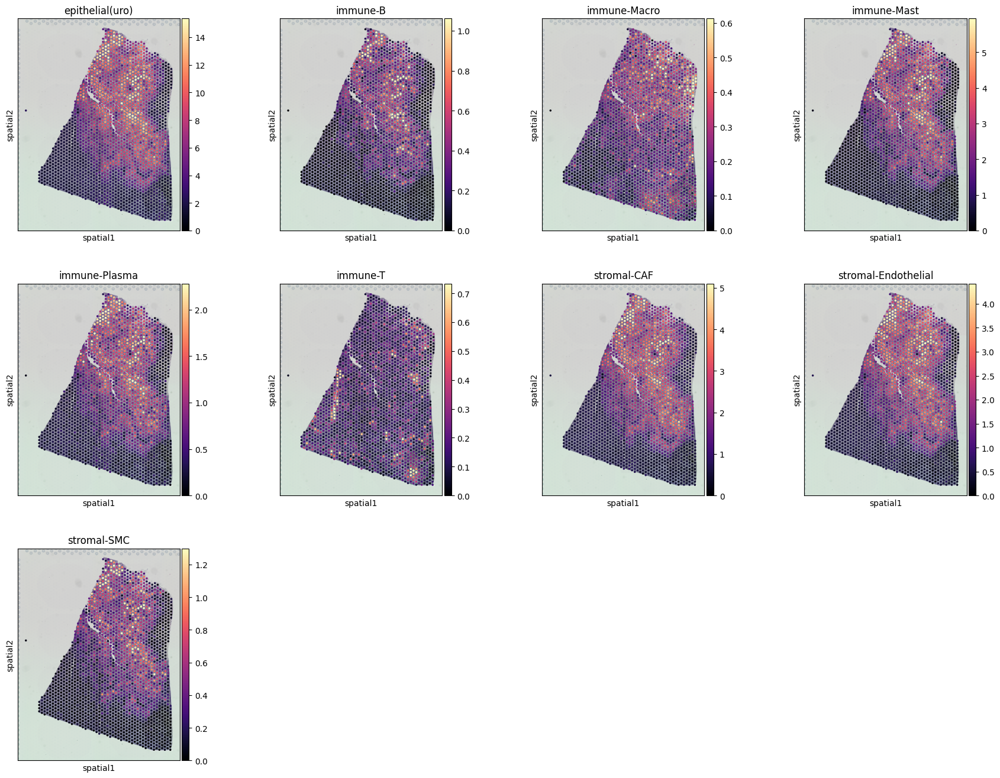

In [219]:

# select one slide
from cell2location.utils import select_slide
for i in range(len(adata_vis_c2l)):
    slide = adata_vis_c2l[i].copy()
    slide.obs[slide.uns['mod']['factor_names']] = slide.obsm['q05_cell_abundance_w_sf']

    # plot in spatial coordinates
    with mpl.rc_context({'axes.facecolor':  'black',
                         'figure.figsize': [4.5, 5]}):
    
        sc.pl.spatial(slide, cmap='magma',
                      color=sc_obj.obs[celltype_col].cat.categories.values,
                      ncols=4,
                      img_key='hires',
                      vmin=0,vmax='p99'
                     )